In [1]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.cross_validation import train_test_split
from sklearn import metrics
import statsmodels.formula.api as smf

# visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
data = pd.read_csv('~/GA/SF_DAT_15/data/ZYX_prices.csv')
data.head()

,time,ZYXprice,ZYX1MinSentiment,ZYX1MinTweets,ZYX5minSentiment,ZYX10minSentiment,ZYX20minSentiment,ZYX30minSentiment,ZYX60minSentiment,ZYX5minTweets,...,ZYX5minPriceChange,ZYX10minPriceChange,ZYX20minPriceChange,ZYX30minPriceChange,ZYX60minPriceChange,5fret,10fret,20fret,30fret,60fret
0,1/11/13 14:42,143.08,0.00000,1,107.48100,294.62752,521.82962,867.60952,851.83339,4,...,-0.000070,0.000140,2.097710e-04,0.000699,0.00070,-3.494790e-04,-4.193310e-04,-0.000559,-0.000629,0.000560
1,1/11/13 14:43,143.05,-53.74050,3,53.74050,240.88702,255.88512,791.02902,673.98089,7,...,-0.000280,-0.000140,9.770000e-08,0.000350,0.00077,2.440000e-08,-1.397380e-04,-0.000839,-0.000139,0.000770
2,1/11/13 14:44,143.04,7.91668,1,61.65718,248.80370,156.32080,821.78570,713.68697,8,...,-0.000349,-0.000349,-1.397140e-04,-0.000210,0.00077,-1.397870e-04,1.399140e-04,-0.000769,-0.000279,0.000979
3,1/11/13 14:45,143.02,22.84000,2,84.49718,242.12700,179.16080,820.05960,663.15197,10,...,-0.000489,-0.000489,-2.096340e-04,-0.000210,0.00070,-6.990000e-05,1.399330e-04,-0.000559,-0.000139,0.001329
4,1/11/13 14:46,143.03,-39.65380,2,-62.63762,50.88820,152.20950,687.08250,587.93667,9,...,-0.000489,-0.000419,-2.096190e-04,-0.000140,0.00070,-2.796570e-04,1.030000e-07,-0.000559,0.000070,0.001259


In [4]:
data.columns

Index([u'ZYXprice', u'ZYX1MinSentiment', u'ZYX1MinTweets', u'ZYX5minSentiment',
       u'ZYX10minSentiment', u'ZYX20minSentiment', u'ZYX30minSentiment',
       u'ZYX60minSentiment', u'ZYX5minTweets', u'ZYX10minTweets',
       u'ZYX20minTweets', u'ZYX30minTweets', u'ZYX60minTweets',
       u'ZYX1minPriceChange', u'ZYX5minPriceChange', u'ZYX10minPriceChange',
       u'ZYX20minPriceChange', u'ZYX30minPriceChange', u'ZYX60minPriceChange',
       u'5fret', u'10fret', u'20fret', u'30fret', u'60fret'],
      dtype='object')

In [9]:
data['1minavg'] = data['ZYX1MinSentiment'] / data['ZYX1MinTweets']
data['5minavg'] = data['ZYX5minSentiment'] / data['ZYX5minTweets']
data['10minavg'] = data['ZYX10minSentiment'] / data['ZYX10minTweets']
data['20minavg'] = data['ZYX20minSentiment'] / data['ZYX20minTweets']
data['30minavg'] = data['ZYX30minSentiment'] / data['ZYX30minTweets']
data['60minavg'] = data['ZYX60minSentiment'] / data['ZYX60minTweets']

In [10]:
data.head(10)

,time,ZYXprice,ZYX1MinSentiment,ZYX1MinTweets,ZYX5minSentiment,ZYX10minSentiment,ZYX20minSentiment,ZYX30minSentiment,ZYX60minSentiment,ZYX5minTweets,...,10fret,20fret,30fret,60fret,1minavg,5minavg,10minavg,20minavg,30minavg,60minavg
0,1/11/13 14:42,143.08,0.00000,1,107.48100,294.62752,521.82962,867.60952,851.83339,4,...,-4.193310e-04,-0.000559,-0.000629,0.000560,0.00000,26.870250,16.368196,9.663511,11.123199,6.760582
1,1/11/13 14:43,143.05,-53.74050,3,53.74050,240.88702,255.88512,791.02902,673.98089,7,...,-1.397380e-04,-0.000839,-0.000139,0.000770,-17.91350,7.677214,12.044351,4.828021,10.013026,5.435330
2,1/11/13 14:44,143.04,7.91668,1,61.65718,248.80370,156.32080,821.78570,713.68697,8,...,1.399140e-04,-0.000769,-0.000279,0.000979,7.91668,7.707148,12.440185,3.190220,10.672542,5.898239
3,1/11/13 14:45,143.02,22.84000,2,84.49718,242.12700,179.16080,820.05960,663.15197,10,...,1.399330e-04,-0.000559,-0.000139,0.001329,11.42000,8.449718,12.106350,3.732517,10.513585,5.480595
4,1/11/13 14:46,143.03,-39.65380,2,-62.63762,50.88820,152.20950,687.08250,587.93667,9,...,1.030000e-07,-0.000559,0.000070,0.001259,-19.82690,-6.959736,3.180512,3.459307,8.808750,4.858981
5,1/11/13 14:47,143.03,0.00000,2,-62.63762,44.84338,157.01430,728.04910,580.01999,10,...,2.098490e-04,-0.000349,0.000350,0.001119,0.00000,-6.263762,3.203099,3.925357,9.333963,4.754262
6,1/11/13 14:48,143.05,152.60100,4,143.70388,197.44438,309.61530,944.45670,703.10429,11,...,-6.980000e-05,-0.000559,0.000070,0.001119,38.15025,13.063989,10.969132,7.200356,11.805709,5.624834
7,1/11/13 14:49,143.02,37.80400,4,173.59120,235.24838,361.22590,928.52020,694.20669,14,...,1.399330e-04,-0.000419,0.000210,0.001329,9.45100,12.399371,10.693108,8.209680,11.323417,5.509577
8,1/11/13 14:50,143.01,40.29410,2,191.04530,275.54248,424.36000,915.07380,734.50079,14,...,2.098540e-04,-0.000209,0.000210,0.001399,20.14705,13.646093,11.480937,9.430222,11.159437,5.738287
9,1/11/13 14:51,142.99,81.66180,3,312.36090,249.72328,559.94660,868.77160,800.56679,15,...,1.520000e-07,-0.000279,0.000700,0.001608,27.22060,20.824060,10.405137,13.022014,10.725575,6.254428


ERROR! Session/line number was not unique in database. History logging moved to new session 31


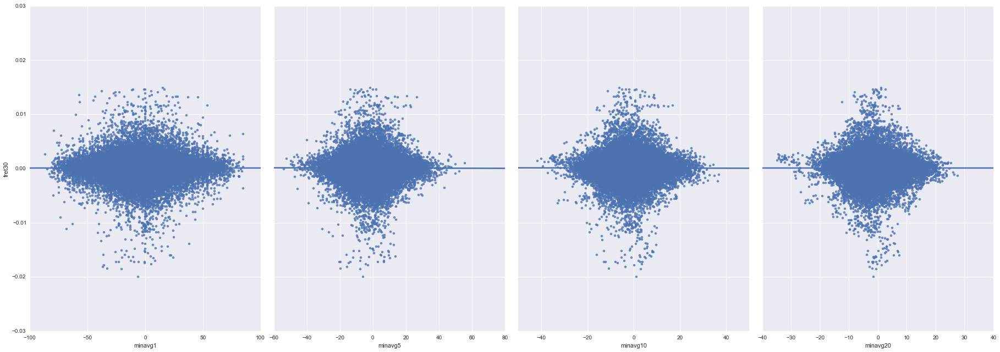

In [112]:
sns.pairplot(df, x_vars=['minavg1','minavg5','minavg10','minavg20'], y_vars='fret30', size=9, aspect=0.7, kind='reg')

ERROR! Session/line number was not unique in database. History logging moved to new session 32


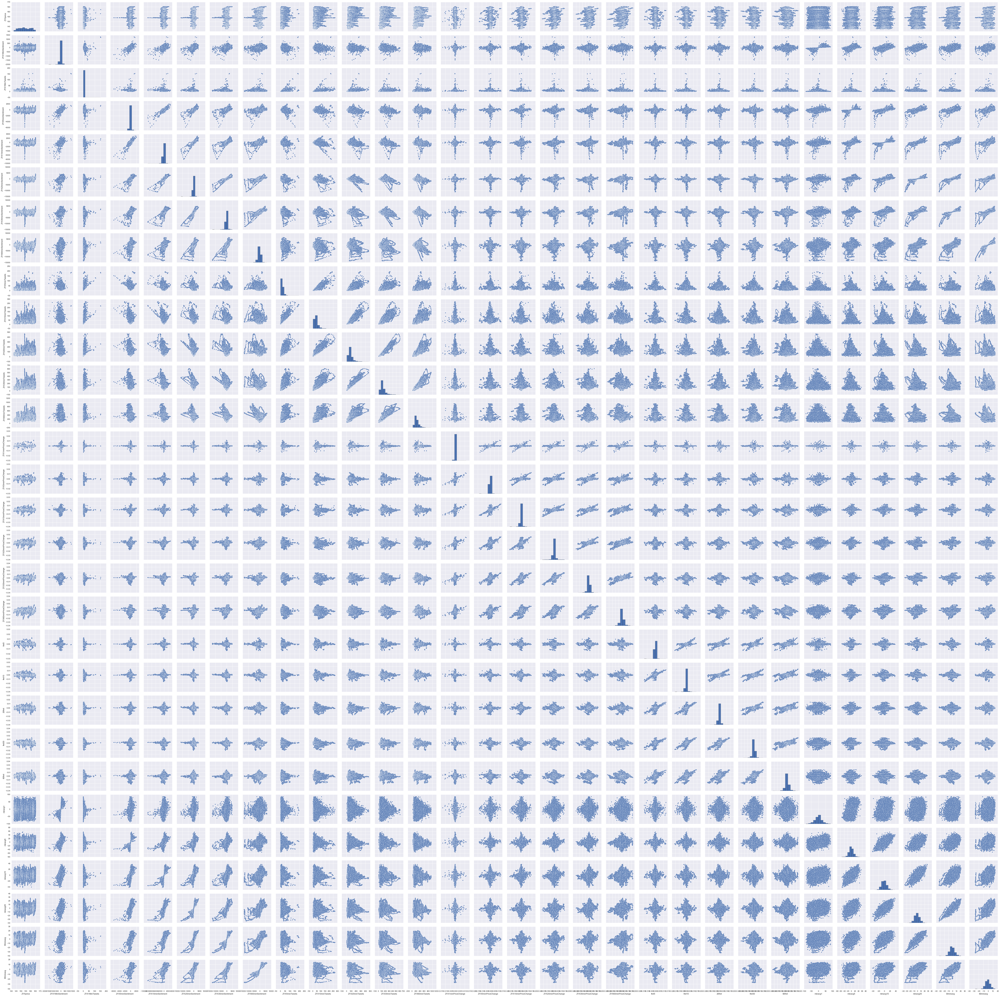

In [113]:
sns.pairplot(df)

In [ ]:
fig, axs = plt.subplots(1, 3, sharey=True)
data.plot(kind='scatter', x='minavg1', y='fret30', ax=axs[0], figsize=(20, 10))
data.plot(kind='scatter', x='minavg5', y='fret30', ax=axs[1])
data.plot(kind='scatter', x='minavg10', y='fret30', ax=axs[2])
data.plot(kind='scatter', x='minavg20', y='fret30', ax=axs[3])

In [110]:
### SCIKIT-LEARN ###

# create X and y
feature_cols = ['minavg1', 'minavg5', 'minavg10', 'minavg20']
X = df[feature_cols]
y = df['fret30']

# instantiate and fit
linreg = LinearRegression()
linreg.fit(X, y)

# print the coefficients
print linreg.intercept_
print linreg.coef_

8.51843000834e-05
[  2.25855622e-07  -7.62761240e-07  -1.28689286e-06   1.81278325e-06]


In [114]:
zip(feature_cols, linreg.coef_)

[('minavg1', 2.258556217751967e-07),
 ('minavg5', -7.6276124011295939e-07),
 ('minavg10', -1.2868928582406313e-06),
 ('minavg20', 1.8127832517738209e-06)]

In [44]:
df.dropna(inplace = True)

In [87]:
df.isnull().sum()

time                   0
ZYXprice               0
ZYX1MinSentiment       0
ZYX1MinTweets          0
ZYX5minSentiment       0
ZYX10minSentiment      0
ZYX20minSentiment      0
ZYX30minSentiment      0
ZYX60minSentiment      0
ZYX5minTweets          0
ZYX10minTweets         0
ZYX20minTweets         0
ZYX30minTweets         0
ZYX60minTweets         0
ZYX1minPriceChange     0
ZYX5minPriceChange     0
ZYX10minPriceChange    0
ZYX20minPriceChange    0
ZYX30minPriceChange    0
ZYX60minPriceChange    0
5fret                  0
fret10                 0
20fret                 0
30fret                 0
60fret                 0
minavg1                0
minavg5                0
minavg10               0
20minavg               0
30minavg               0
60minavg               0
dtype: int64

In [57]:
# define a function that accepts X and y and computes testing RMSE
def train_test_rmse(X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)
    linreg = LinearRegression()
    linreg.fit(X_train, y_train)
    y_pred = linreg.predict(X_test)
    return np.sqrt(metrics.mean_squared_error(y_test, y_pred))

In [107]:
feature_cols = ['minavg1', 'minavg5', 'minavg10', 'minavg20']
X = df[feature_cols]
train_test_rmse(X, y)
#lower is better because you want less error

0.0020027544379074523

In [108]:
feature_cols = ['minavg1', 'minavg5']
X = df[feature_cols]
train_test_rmse(X, y)

0.0020027838045570236

In [77]:
def very_deep_copy(self):
    return pd.DataFrame(self.values.copy(), self.index.copy(), self.columns.copy())

In [78]:
pd.DataFrame.very_deep_copy = very_deep_copy

In [79]:
df2 = df.very_deep_copy()

In [81]:
df.rename(columns={'1minavg': 'minavg1', '5minavg': 'minavg5', '10minavg': 'minavg10'}, inplace=True)

In [104]:
df.rename(columns={'20minavg': 'minavg20'}, inplace=True)

In [101]:
lm = smf.ols(formula='fret30 ~ minavg1 + minavg5 + minavg10', data=df).fit()
lm.rsquared

2.0138605008379606e-05

In [105]:
lm = smf.ols(formula='fret30 ~ minavg1 + minavg5 + minavg10+ minavg20', data=df).fit()
lm.rsquared
#higher r-squared means better fit

3.5121510897906383e-05

In [106]:
print lm.pvalues
#it isn't due to random noise, can reject null hypothesis at p=0.05

Intercept    1.770682e-19
minavg1      6.103137e-01
minavg5      5.637760e-01
minavg10     5.429953e-01
minavg20     4.038891e-01
dtype: float64


In [ ]:
#r-squared more universal is between 0 - 1, higher then the more it is accounting variation
#RMSE is in the unit you are using